# Wprowadzenie teoretyczne

Zanim przejdziemy do głównych eksperymentów badawczych, konieczne jest zrozumienie podstawowych mechanizmów rządzących modelami dyfuzyjnymi oraz natury danych, z którymi będziemy pracować. Ten notatnik ma na celu wizualne wyjaśnienie pojęć, takich jak rodzaje szumu, harmonogramy dyfuzji, parametry procesu oraz różnice między podejściami SDEdit i FunDPS.

## 1. Charakter szumu: Biały Szum i Gładkie Pola Losowe (GRF)

W klasycznych modelach dyfuzyjnych (DDPM) standardem jest używanie **szumu białego** (White Noise), czyli niezależnych próbek losowanych z rozkładu normalnego. Taki szum jest wysoce nieregularny i dobrze sprawdza się w obrazach 2D. 

Jednakże w przypadku sygnałów 1D (takich jak funkcje matematyczne czy sygnały fizyczne), które z natury są ciągłe i gładkie, dodawanie szumu o wysokich częstotliwościach może utrudniać sieci neuronowej naukę sygnału. Z tego powodu w architekturze **FunDPS (EDM1D)** wprowadzono **Gładkie Pola Losowe (Gaussian Random Fields - GRF)**. Szum GRF powstaje poprzez splot klasycznego szumu białego z jądrem Gaussa, co narzuca mu przestrzenną korelację i gładkość.

Poniższa wizualizacja ukazuje różnicę wpływu obu rodzajów szumu na trzy wybrane funkcje matematyczne.

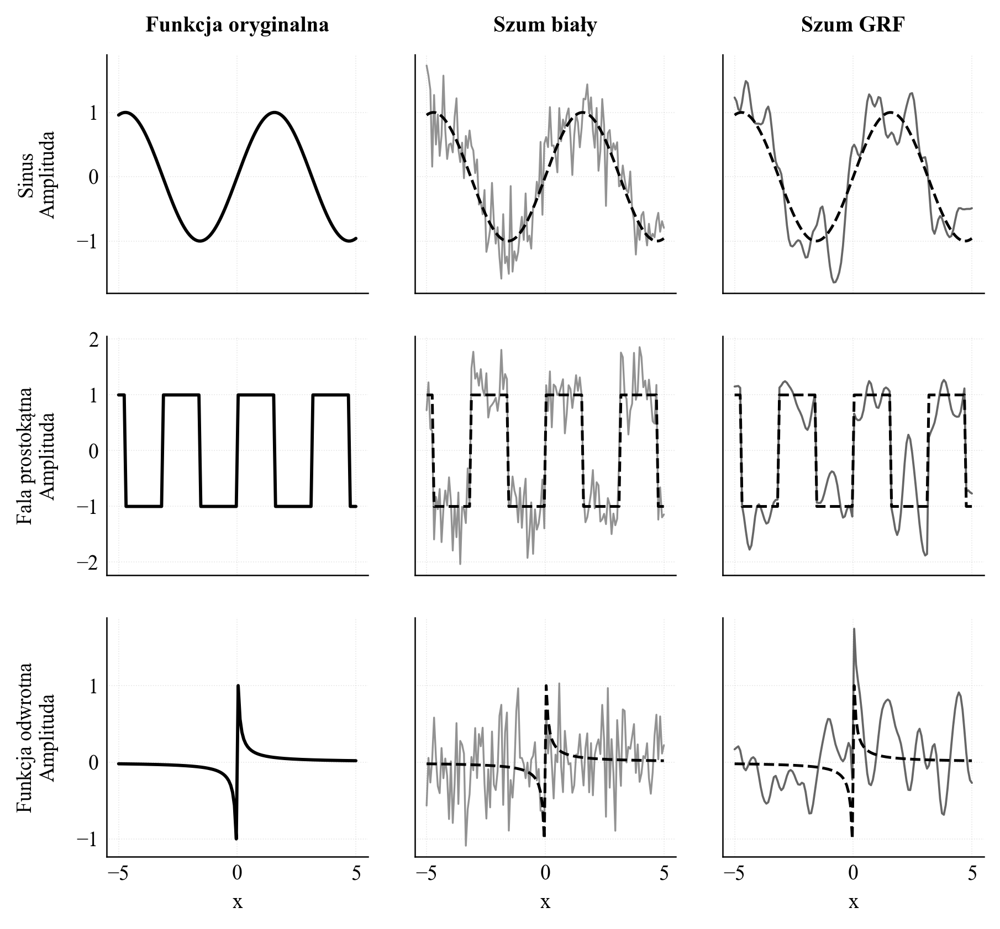

In [1]:
from IPython.display import Image, display, HTML
display(Image("../images/visualisations/grf_vs_white.png"))

## 2. Podstawy matematyczne DDPM

Modele dyfuzyjne (Denoising Diffusion Probabilistic Models) opierają się na procesie Markowa, w którym stopniowo niszczymy sygnał dodając do niego szum, a następnie uczymy sieć neuronową odwracać ten proces.

### Pojęcia i równania:

* **T (kroki dyfuzji)** - całkowita liczba dyskretnych kroków czasowych, na które podzielony jest proces. Stanowi to swego rodzaju "rozdzielczość" procesu. Bardzo duże $T$ (np. 1000) oznacza, że w każdym kroku dodajemy niewielką ilość szumu, co daje płynne i stabilne przejścia, ale wydłuża czas obliczeń. Niskie $T$ (np. 50) przyspiesza proces, ale wymusza agresywne odszumianie.
  
* **Epoki (epochs)** - parametr określający, ile razy model podczas treningu "zobaczył" cały zbiór danych. Im więcej epok, tym lepiej sieć potrafi aproksymować prawdziwy rozkład prawdopodobieństwa wykresu funkcji.

* **Harmonogram Beta ($\beta_t$)** - skalar określający wariancję szumu dodawanego w pojedynczym kroku $t$. 

W procesie w przód (Forward Process) nie musimy aplikować szumu krok po kroku. Dzięki właściwościom rozkładu Gaussa, możemy przeskoczyć bezpośrednio z czystego sygnału $x_0$ do zaszumionego $x_t$ używając wzoru zdefiniowanego przez Ho et al.:

$$q(x_t | x_0) = \mathcal{N}(x_t; \sqrt{\bar{\alpha}_t} x_0, (1 - \bar{\alpha}_t)\mathbf{I})$$

gdzie:
* $\alpha_t = 1 - \beta_t$
* $\bar{\alpha}_t = \prod_{i=1}^t \alpha_i$ (skumulowany iloczyn)

Stąd bezpośredni wzór na stan w kroku $t$, używany w klasie `DDPM1D`:
$$x_t = \sqrt{\bar{\alpha}_t} x_0 + \sqrt{1 - \bar{\alpha}_t} \epsilon$$

### Linear vs Cosine Schedule (Harmonogram)
* **Linear:** $\beta_t$ rośnie liniowo od początku do końca procesu. Powoduje to, że sygnał jest drastycznie niszczony już w pierwszych krokach (dla małych $t$).
* **Cosine:** Wprowadzony przez Nichol i Dhariwal (2021). Funkcja cosinus sprawia, że szum dodawany jest znacznie łagodniej w środkowej fazie procesu, co pozwala modelowi lepiej uczyć się subtelnych detali sygnału i zapobiega przedwczesnemu zniszczeniu informacji.

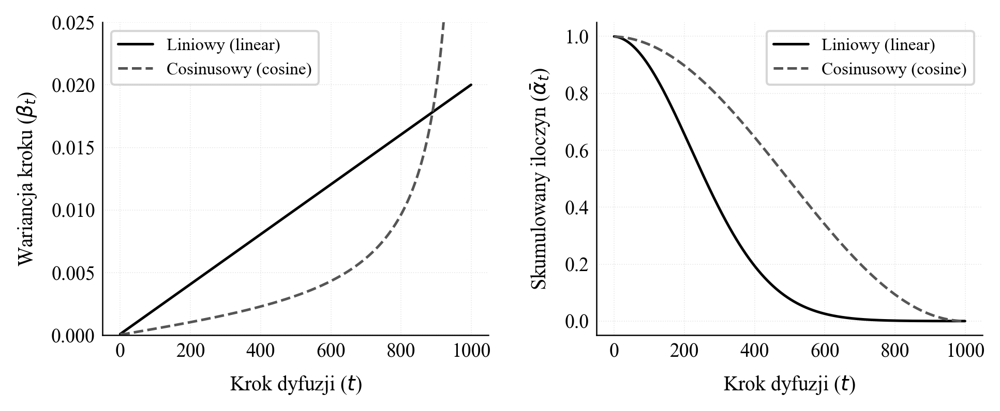

In [2]:
def get_beta_schedule_local(schedule_type, beta_start=1e-4, beta_end=0.02, n_T=1000):
    if schedule_type == 'linear':
        return np.linspace(beta_start, beta_end, n_T)
    elif schedule_type == 'cosine':
        steps = n_T + 1
        x = np.linspace(0, n_T, steps)
        alphas_cumprod = np.cos(((x / n_T) + 0.008) / 1.008 * np.pi / 2) ** 2
        alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
        betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
        return np.clip(betas, 0.0001, 0.9999)
        
display(Image("../images/visualisations/linear_vs_cosine.png"))

## 3. Procesy zaszumiania i odszumiania

### Proces w przód (Forward Process - zaszumianie)
Poniżej zademonstrujemy, jak wygląda powolna destrukcja czystego sygnału sinusa, w miarę jak krok $t$ zbliża się do $T$.

### Podejście SDEdit (Stochastic Differential Equation Editing)
SDEdit to paradygmat, który zamiast losować czysty szum z rozkładu normalnego na początku generacji, wykorzystuje istniejący, zaszumiony sygnał z zewnątrz. Algorytm "wstrzykuje" ten sygnał do procesu dyfuzji w punkcie $t_{start} < T$. Następnie uruchamia klasyczny proces odszumiania. Zmusza to sieć do wygładzenia sygnału, zachowując jego makroskopową strukturę.

### Podejście FunDPS (Function-space Diffusion Posterior Sampling)
FunDPS rozwiązuje problem jako *zadanie odwrotne* (Inverse Problem). Dysponuje tylko operatorem maskującym $H$, co oznacza, że widzi ułamek punktów pomiarowych. Model najpierw uczy się ogólnego wyglądu gładkich funkcji poprzez bezwarunkowe dodawanie i usuwanie szumu GRF (Prior). Podczas odszumiania, na każdy krok gradientowo wymuszana jest korekta (Guidance), aby powstający sygnał "przechodził" przez rzadkie obserwacje.

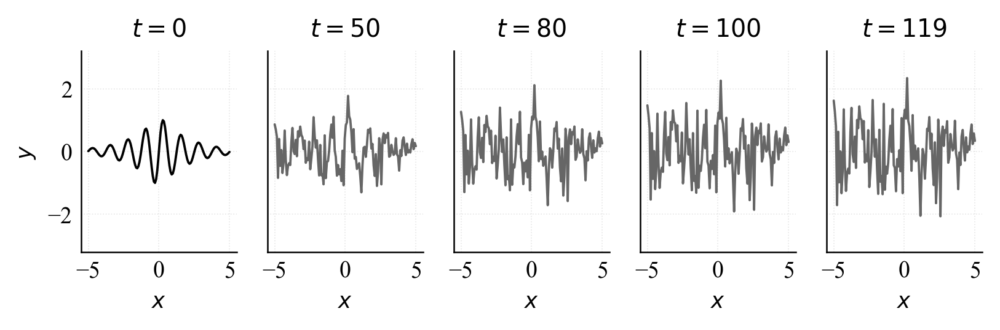

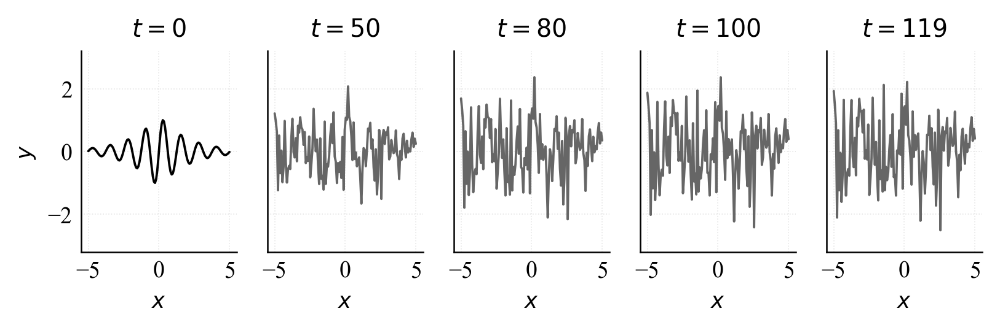

In [3]:
display(Image("../images/visualisations/linear_forward.png"))
display(Image("../images/visualisations/cosine_forward.png"))

## 4. Architektury i odszumianie (Reverse Process) 
W głównych eksperymentach badamy trzy architektury do przewidywania szumu (estymacji $\epsilon_\theta$):
1.  **MLP (Multi-Layer Perceptron)** jest klasyczną gęstą siecią. Nie posiada założeń o lokalności przestrzennej.
2.  **Conv1D** jest siecią splotową 1D. Posiada wewnętrzne założenie o lokalności sygnału (inductive bias), dobrze radzi sobie z wygładzaniem lokalnych artefaktów.
3.  **U-Net 1D** jest strukturą koder-dekoder z połączeniami omijającymi (skip-connections), zdolną do analizy sygnału na wielu skalach jednocześnie (od detali po globalny kształt).



## 5. FunDPS

W przeciwieństwie do SDEdit, gdzie sieć otrzymuje pełny (ale zaszumiony) sygnał, **FunDPS (Function-space Diffusion Posterior Sampling)** rozwiązuje problem braku danych. Model otrzymuje jedynie rzadkie obserwacje (np. 10% punktów sygnału), a jego zadaniem jest zrekonstruowanie (inpainting) całej reszty.

Aby to osiągnąć, FunDPS wprowadza:
1. **Ciągły czas zamiast dyskretnego**. Zamiast kroków $t \in [0, T]$, model EDM używa ciągłego poziomu szumu $\sigma \in [\sigma_{min}, \sigma_{max}]$. Oznacza to, że sieć może być próbkowana z dowolną rozdzielczością bez konieczności ponownego trenowania.
2. **Kierowanie gradientowe (Guidance)**. W każdym kroku odszumiania, model najpierw "zgaduje" jak wygląda czysty sygnał ($x_0$). Następnie algorytm sprawdza, jak bardzo to przewidywanie różni się od prawdziwych punktów pomiarowych $y$. Obliczany jest gradient z tego błędu (Loss), który przesuwa trajektorię dyfuzji w stronę prawidłowego rozwiązania. Siłę tego pchnięcia określa parametr $\zeta$ (Zeta).

$$x_{i+1} = x_i + (\sigma_{i+1} - \sigma_i) \left[ \frac{x_i - D_\theta(x_i, \sigma_i)}{\sigma_i} + \zeta \cdot \nabla_{x_i} ||H(D_\theta(x_i, \sigma_i)) - y||^2_2 \right]$$

Gdzie:
* $D_\theta$ - model odszumiający (Prior)
* $H$ - operator pomiarowy (maska zostawiająca tylko znane punkty)
* $\nabla_{x_i}$ - gradient prowadzący do zgodności z danymi (Data Consistency)

### Hiperparametry:

* Waga Guidance ($\zeta$ - Zeta) decyduje o sile gradientu zmuszającego sygnał do przejścia przez punkty pomiarowe.
  * *Niskie $\zeta$ (np. 10):* Model ufa swojej wrodzonej wiedzy (Priorowi). Generuje gładkie funkcje, ale może ominąć kropki obserwacji (Under-fitting).
  * *Wysokie $\zeta$ (np. 1000):* Model chce trafić w punkty pomiarowe, ignorując gładkość (Prior). Skutkuje to zniekształceniami szumu i ostrymi, niefizycznymi skokami pomiędzy punktami (Over-fitting / Eksplozja gradientu).
* Liczba kroków ($N$ / `num_steps`) decyduje o rozdzielczości całkowania równania różniczkowego metodą Eulera. Im więcej kroków, tym przejście od $\sigma_{max}$ do $\sigma_{min}$ jest dokładniejsze, a proces płynniejszy. Zbyt mała liczba kroków sprawia, że skoki w przestrzeni są zbyt drastyczne, co potęguje błędy aproksymacji (sygnał pozostaje chropowaty i zaszumiony).

Poniżej zaimplementowano generator animacji (GIF), który ukazuje, jak z szumu o wariancji $\sigma_{max}$ wyłania się trajektoria, która pod wpływem siły $\zeta$ uwzględnia punkty pomiarowe.

Funkcja sin z szumem GRF


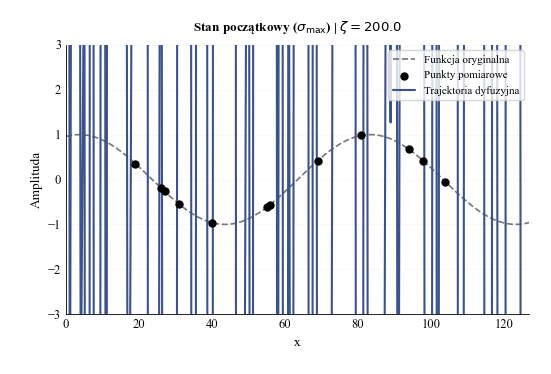

Funkcja 1_over_x z szumem white


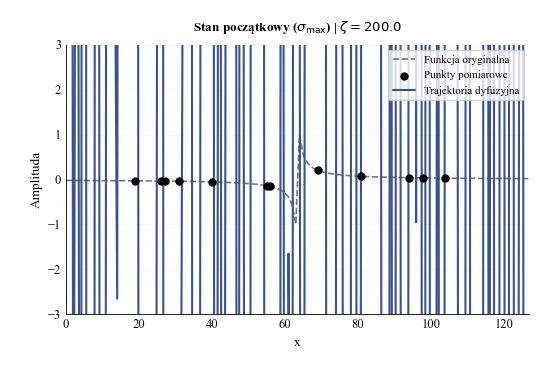

In [4]:
print("Funkcja sin z szumem GRF")
display(Image(filename="../images/visualisations/fundps_animacja_sin_grf.gif"))

# print("Funkcja sin z szumem white")
# display(Image(filename="../images/visualisations/fundps_animacja_sin_white.gif"))

# print("Funkcja 1_over_x z szumem GRF")
# display(Image(filename="../images/visualisations/fundps_animacja_1_over_x_grf.gif"))

print("Funkcja 1_over_x z szumem white")
display(Image(filename="../images/visualisations/fundps_animacja_1_over_x_white.gif"))

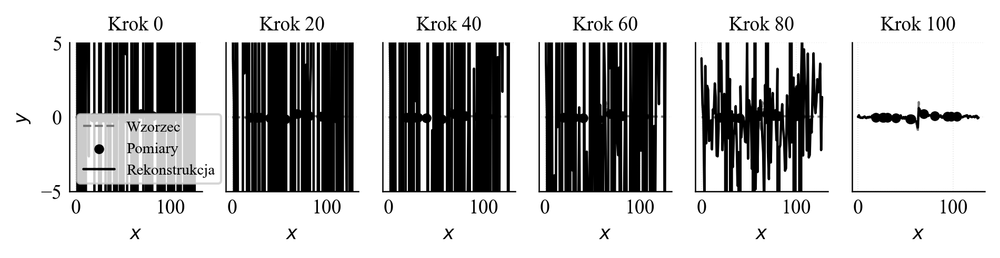

In [5]:
display(Image("../images/visualisations/ewolucja_odszumiania.png"))

Trenowanie zróżnicowanego priora dyfuzyjnego...
Uruchamianie próbkowania w siatce parametrów...


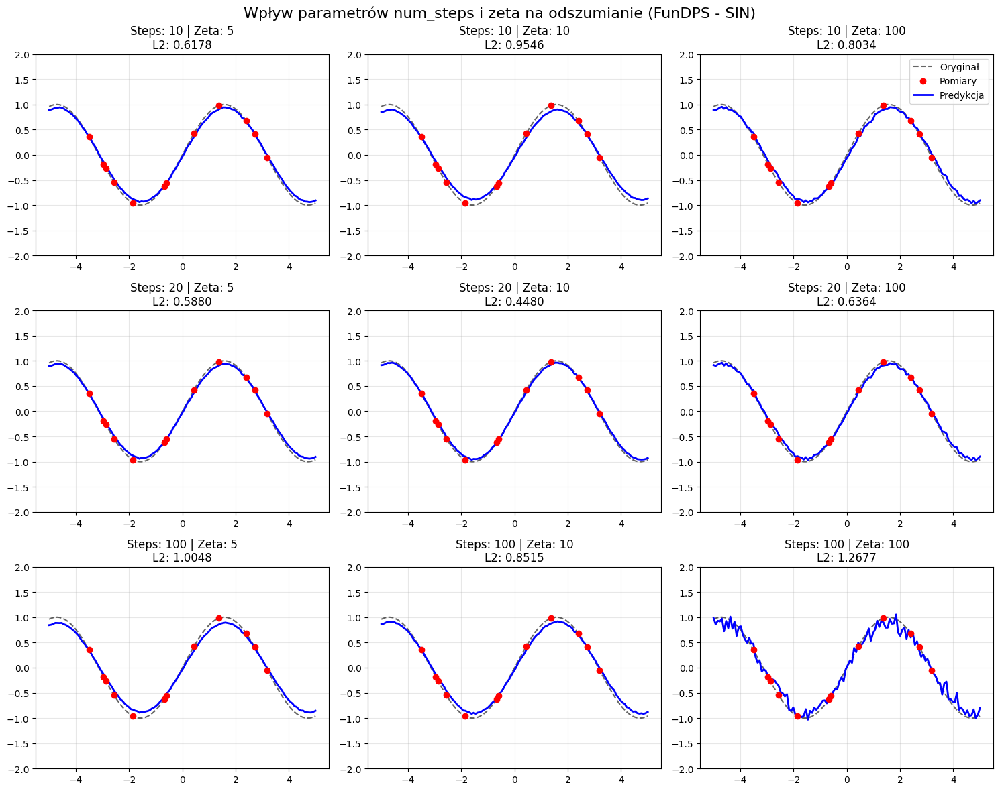

In [13]:
import sys
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
sys.path.append(os.path.abspath('..'))
from utils.samplers import MathFunctions
from models.edm1d import FunDPSSampler, ForwardOperator, EDMDenoiser1D

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

math_funcs = MathFunctions(num_points=128)
x, y_true = math_funcs.get_function('sin')
y_true_tensor = torch.tensor(y_true, dtype=torch.float32).unsqueeze(0).to(device)

np.random.seed(42)
num_obs = int(128 * 0.10)
mask_idx = np.sort(np.random.choice(128, num_obs, replace=False))
forward_op = ForwardOperator(mask_idx)
obs_tensor = forward_op(y_true_tensor)

model = EDMDenoiser1D(data_dim=128).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=2e-3)

model.train()
batch_size = 64
x_tensor = torch.tensor(x, dtype=torch.float32, device=device).unsqueeze(0) # [1, 128]

print("Trenowanie zróżnicowanego priora dyfuzyjnego...")
for _ in range(150):  
    optimizer.zero_grad()
    
    raw_ampl = 0.5 + np.random.rand(batch_size, 1) * 1.0
    raw_phase = np.random.rand(batch_size, 1) * 2 * np.pi
    
    ampl = torch.tensor(raw_ampl, dtype=torch.float32, device=device)
    phase = torch.tensor(raw_phase, dtype=torch.float32, device=device)
    
    y_train_batch = ampl * torch.sin(x_tensor + phase)
    
    rnd_normal = torch.randn(batch_size, device=device)
    sigma = (rnd_normal * 1.2 - 1.2).exp()
    noise = torch.randn((batch_size, 128), device=device) * sigma.unsqueeze(1)
    y_noisy = y_train_batch + noise
    
    y_pred = model(y_noisy, sigma)
    weight = (sigma ** 2 + 1) / (sigma ** 2 + 1e-5)
    loss = (weight.unsqueeze(1) * (y_pred - y_train_batch) ** 2).mean()
    
    loss.backward()
    optimizer.step()

sampler = FunDPSSampler(model, device)
steps_list = [10,20, 100]
zetas_list = [5, 10, 100]

fig, axes = plt.subplots(3, 3, figsize=(15, 12))
fig.suptitle('Wpływ parametrów num_steps i zeta na odszumianie (FunDPS - SIN)', fontsize=16)

print("Uruchamianie próbkowania w siatce parametrów...")
for i, steps in enumerate(steps_list):
    for j, zeta in enumerate(zetas_list):
        torch.manual_seed(42) 
        
        pred_tensor = sampler.sample(
            obs_tensor, forward_op, num_steps=steps, zeta=zeta, data_dim=128
        )
        pred_np = pred_tensor.cpu().numpy()[0]
        
        l2_err = np.linalg.norm(y_true - pred_np)
        
        ax = axes[i, j]
        ax.plot(x, y_true, 'k--', label='Oryginał', alpha=0.6)
        ax.scatter(x[mask_idx], y_true[mask_idx], color='red', zorder=5, label='Pomiary')
        ax.plot(x, pred_np, 'b-', label='Predykcja', linewidth=2)
        
        ax.set_title(f'Steps: {steps} | Zeta: {zeta}\nL2: {l2_err:.4f}')
        ax.grid(True, alpha=0.3)
        ax.set_ylim(-2.0, 2.0)
        
        if i == 0 and j == 2:
            ax.legend(loc='upper right')

plt.tight_layout()
plt.show()

In [14]:
import ipywidgets as widgets
from IPython.display import display
import matplotlib.pyplot as plt
import numpy as np

history_cache = {}

def get_history_for_zeta(zeta_val):
    if zeta_val not in history_cache:
        print(f"Obliczam dyfuzję dla Zeta={zeta_val}...", end='\r')
        torch.manual_seed(42) 
        hist = sampler.sample_with_history(
            observation=obs_tensor, 
            forward_op=forward_op, 
            num_steps=100, 
            zeta=zeta_val
        )
        history_cache[zeta_val] = hist
        print(" " * 50, end='\r') 
    return history_cache[zeta_val]

def plot_interactive_fundps(Krok, Zeta):
    history = get_history_for_zeta(Zeta)    
    step_idx = min(Krok, len(history) - 1)
    current_trajectory = history[step_idx]
    
    fig, ax = plt.subplots(figsize=(10, 5))
    
    measurements = obs_tensor.cpu().numpy()[0]
    ax.plot(x, y_true, color='gray', linestyle='--', alpha=0.5, label='Oryginał')
    ax.scatter(x[mask_idx], measurements, color='red', s=60, zorder=5, label='Pomiary')
    ax.plot(x, current_trajectory, color='#1f77b4', linewidth=2.5, label='Sygnał FunDPS')
    
    ax.set_ylim(-3, 3) 
    
    ax.set_title(rf"Ewolucja FunDPS | Krok odszumiania: {step_idx}/100 | Siła Zeta = {Zeta}", fontsize=14)
    ax.legend(loc='upper right')
    ax.grid(True, linestyle=':', alpha=0.7)
    
    plt.show()

step_slider = widgets.IntSlider(
    value=100, min=0, max=100, step=1, 
    description='Krok:', continuous_update=True, layout=widgets.Layout(width='400px')
)

zeta_slider = widgets.FloatSlider(
    value=10.0, min=0.0, max=200.0, step=5.0, 
    description='Zeta:', continuous_update=False, layout=widgets.Layout(width='400px')
)

out = widgets.interactive_output(plot_interactive_fundps, {'Krok': step_slider, 'Zeta': zeta_slider})
display(widgets.VBox([step_slider, zeta_slider, out]))